In [1]:
from config import *

DeepLabv3 Показывает более качественные результаты сегментации, хотя она и не предназнаена для спутниковых снимков

In [2]:
import torchvision.models as models
import torch

model = models.segmentation.deeplabv3_resnet50(weights="DeepLabV3_ResNet50_Weights.DEFAULT")

In [3]:
model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=(1, 1))

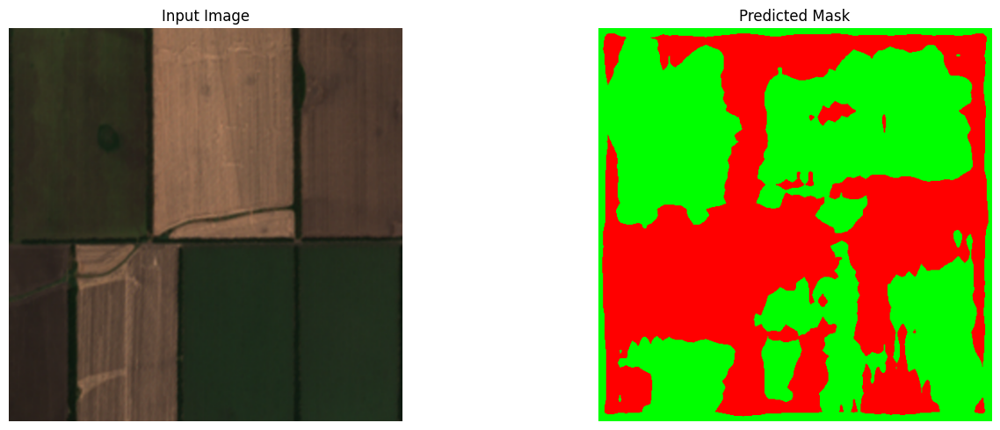

In [4]:
from src.data.utils import show_prediction_image
from PIL import Image
from torchvision.transforms import ToTensor

show_prediction_image(ToTensor()(Image.open(EXAMPLES_DIR + '512x512_fields.png')), model)

Попробуем обучить

In [5]:
import torch.optim as optim
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [6]:
from src.data.dataset import SatelliteDataset
from src.data.paired_transforms.random_crop import PairedRandomCrop
from src.data.paired_transforms.random_flips import PairedRandomHorizontalFlip, PairedRandomVerticalFlip
from src.data.paired_transforms.random_rotation import PairedRandomRotation
from src.data.utils import create_dataloaders, show_dataloader_examples
from src.data.transforms.image_distortions import *

from torchvision.transforms import v2
import torch

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [12]:
image_transforms = v2.Compose([
    RandomHue((-0.05,0.05)),
    RandomSaturation(),
    RandomBrightness(),
    RandomContrast(),
    v2.ToDtype(torch.float32, scale=True),
])
paired_transforms = v2.Compose([
    PairedRandomHorizontalFlip(),
    PairedRandomVerticalFlip(),
    PairedRandomCrop(INPUT_IMG_SIZE),
    PairedRandomRotation(),
])
dataset = SatelliteDataset(IMAGES_DIR, MASKS_DIR, paired_transforms, image_transforms)
train_dataloader, test_dataloader = create_dataloaders(dataset, 4, 4)

Epoch 1/25 [Test]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.66it/s, loss=0.16]


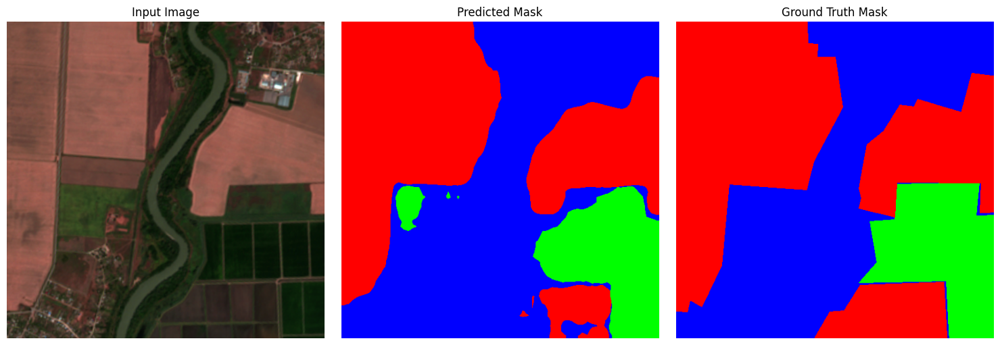

Train Loss = 0.5955739183085306. Test Loss = 0.4110752630801428


Epoch 2/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.62it/s, loss=0.287]


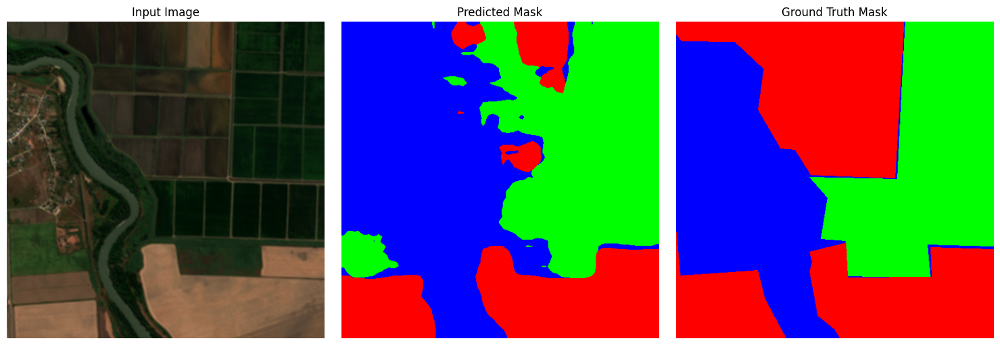

Train Loss = 0.5312510964416323. Test Loss = 0.4396620812870207


Epoch 3/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.56it/s, loss=0.293]


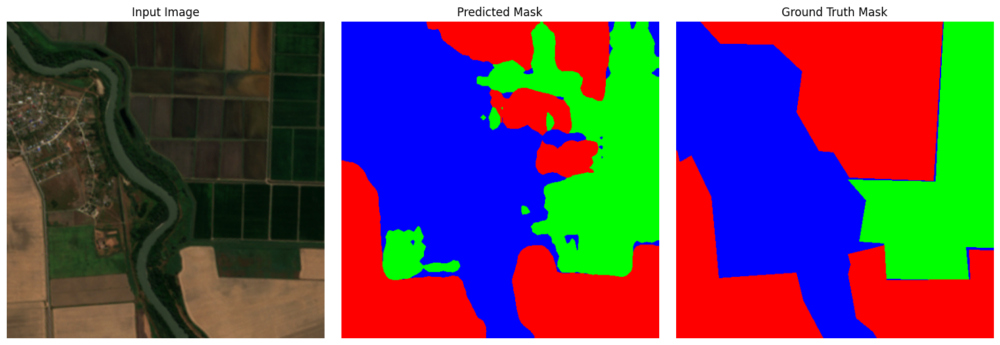

Train Loss = 0.5745831787586212. Test Loss = 0.40645082933562143


Epoch 4/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.65it/s, loss=0.181]


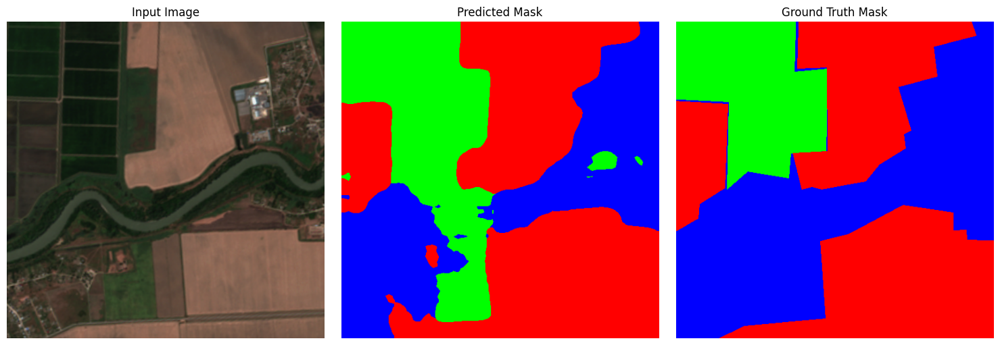

Train Loss = 0.5493017443588801. Test Loss = 0.4326167007287343


Epoch 5/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.67it/s, loss=0.407]


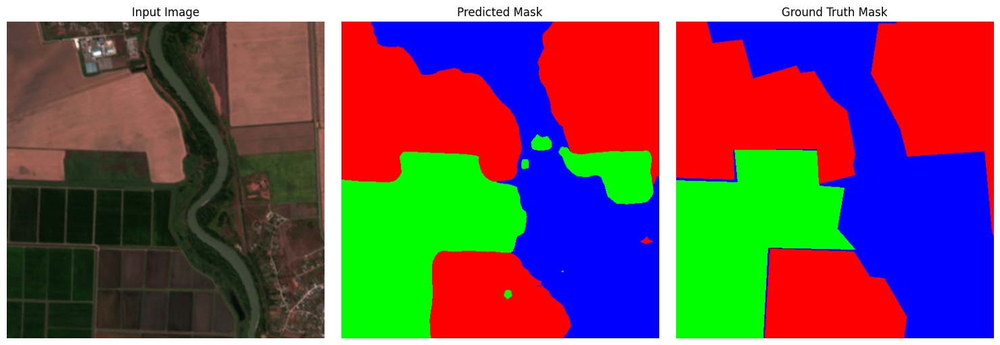

Train Loss = 0.5116443485021591. Test Loss = 0.45949178366434007


Epoch 6/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.71it/s, loss=0.516]


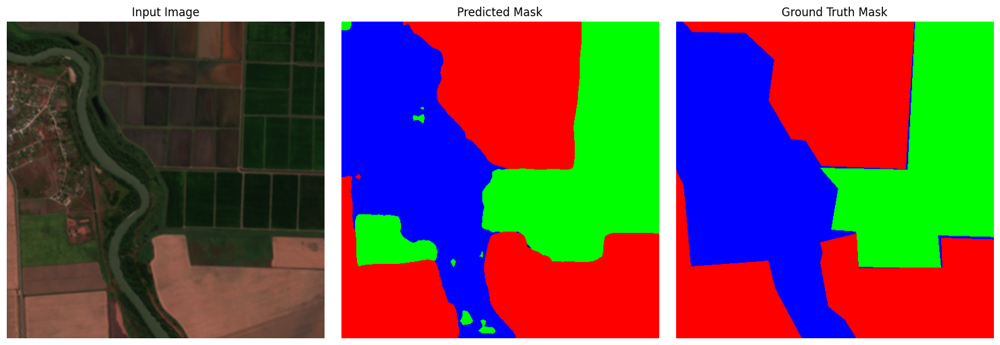

Train Loss = 0.5319441979839689. Test Loss = 0.38234726360866


Epoch 7/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.62it/s, loss=0.254]


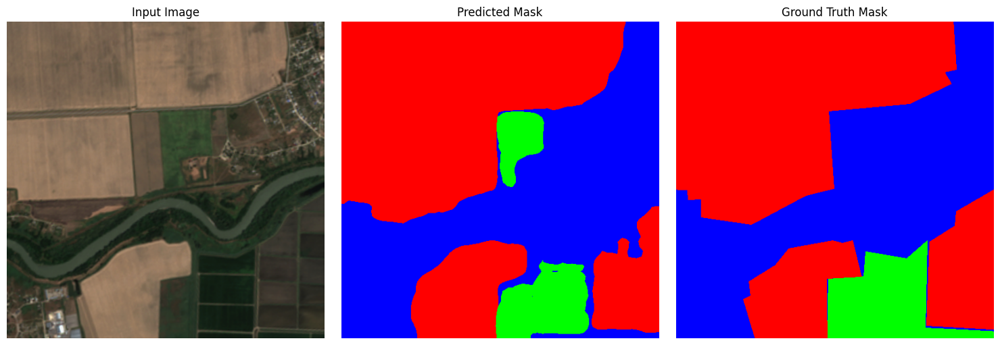

Train Loss = 0.46150773749465035. Test Loss = 0.3759470655804589


Epoch 8/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.65it/s, loss=0.0745]


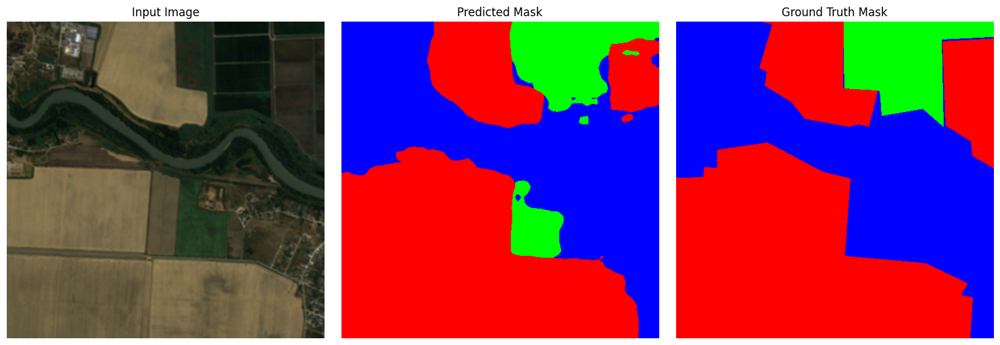

Train Loss = 0.5152053095045543. Test Loss = 0.4000784741980689


Epoch 9/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.66it/s, loss=0.172]


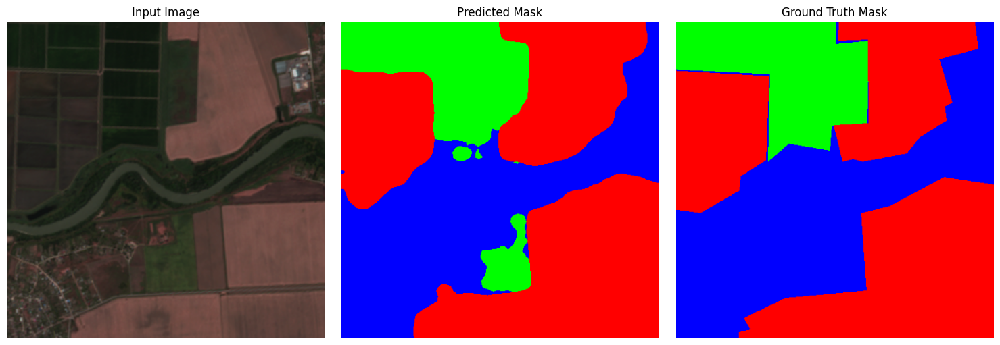

Train Loss = 0.5070237166824795. Test Loss = 0.3745999046734401


Epoch 10/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.62it/s, loss=0.335]


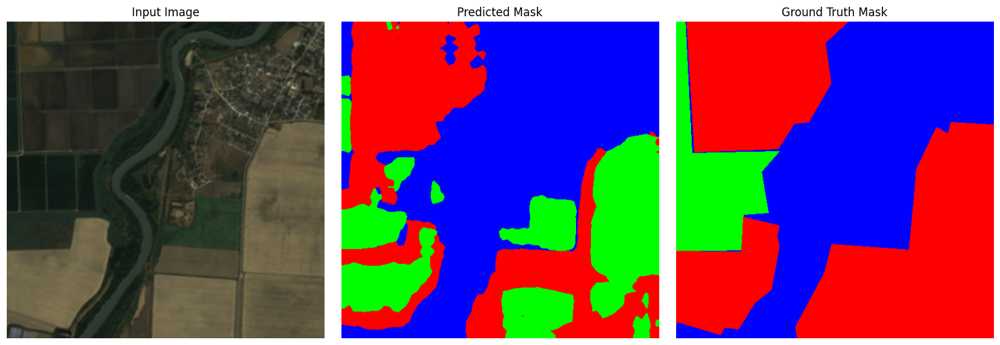

Train Loss = 0.4713740174259458. Test Loss = 0.36543399294217427


Epoch 11/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.62it/s, loss=0.202]


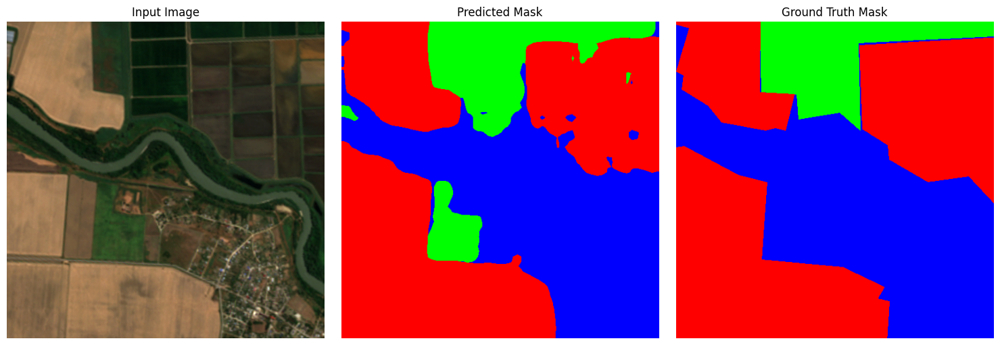

Train Loss = 0.47052482891650427. Test Loss = 0.367081569206147


Epoch 12/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.68it/s, loss=0.476]


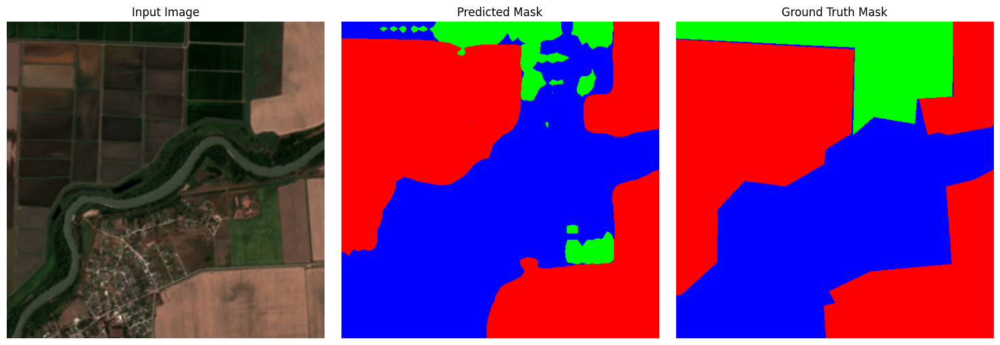

Train Loss = 0.4482507560934339. Test Loss = 0.3912458564553942


Epoch 13/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.61it/s, loss=0.247]


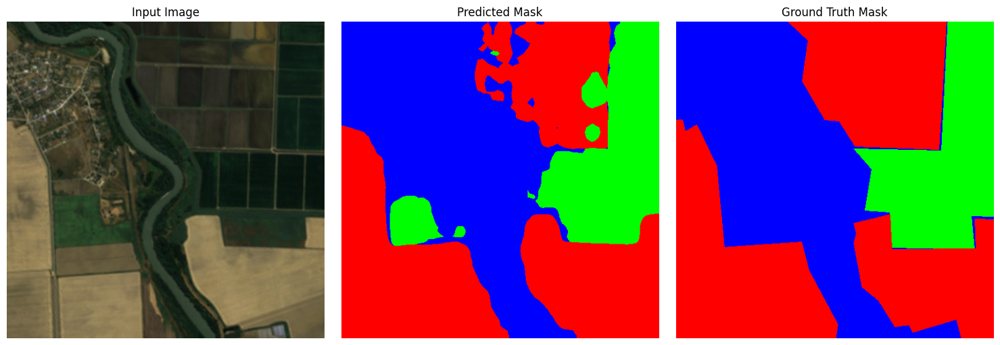

Train Loss = 0.4522058992158799. Test Loss = 0.34991494644255866


Epoch 14/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.67it/s, loss=0.186]


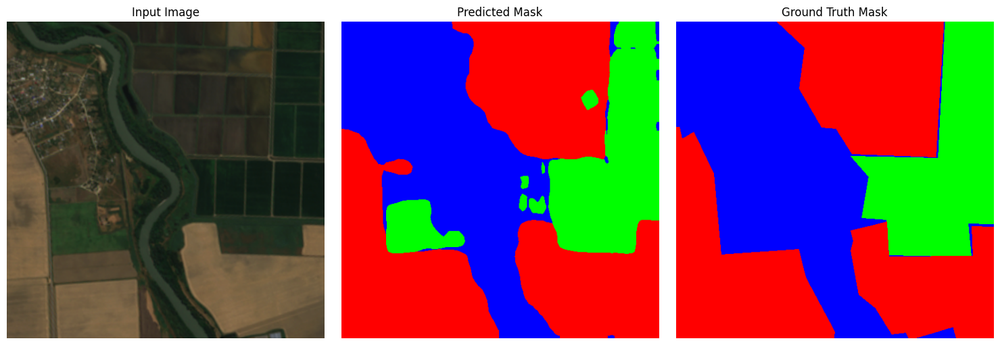

Train Loss = 0.42053249719597047. Test Loss = 0.3390492440689178


Epoch 15/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.65it/s, loss=0.68]


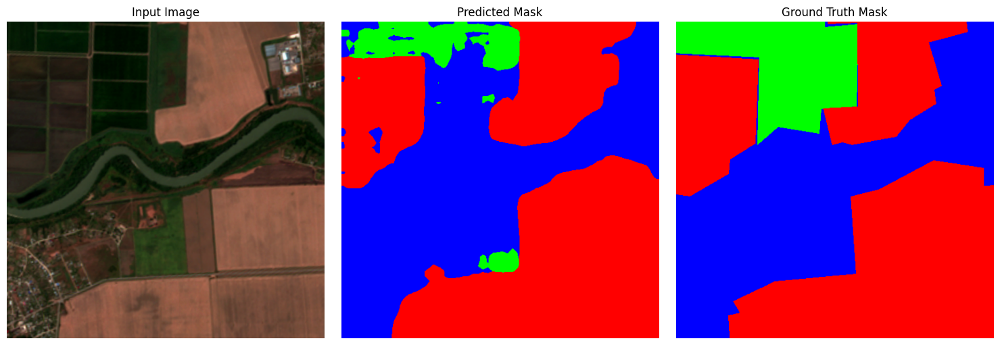

Train Loss = 0.44858944288321906. Test Loss = 0.40749253034591676


Epoch 16/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.60it/s, loss=0.188]


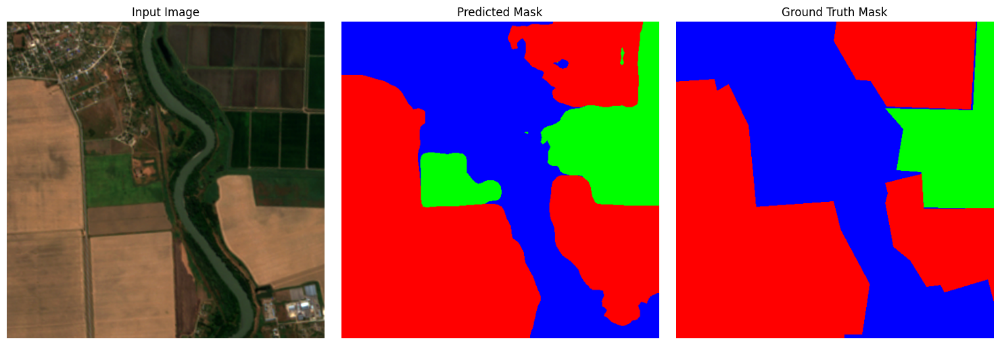

Train Loss = 0.43861166891597564. Test Loss = 0.35590578104768483


Epoch 17/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.63it/s, loss=0.31]


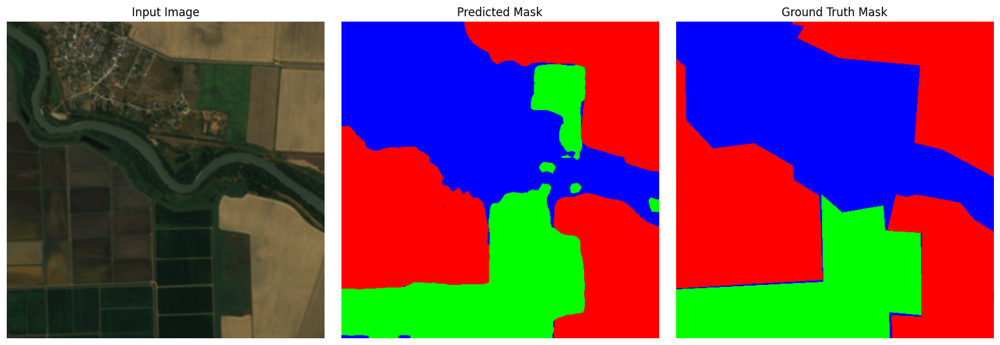

Train Loss = 0.42247096214975627. Test Loss = 0.35047733329591296


Epoch 18/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.64it/s, loss=0.269]


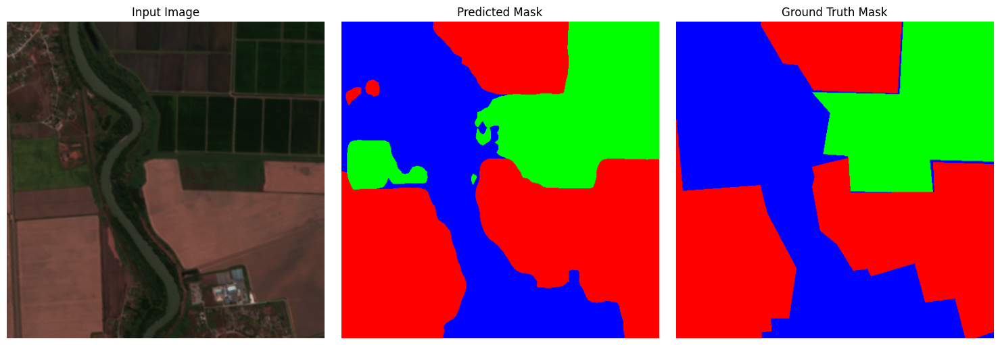

Train Loss = 0.42716783398673647. Test Loss = 0.3461490327403659


Epoch 19/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.63it/s, loss=0.235]


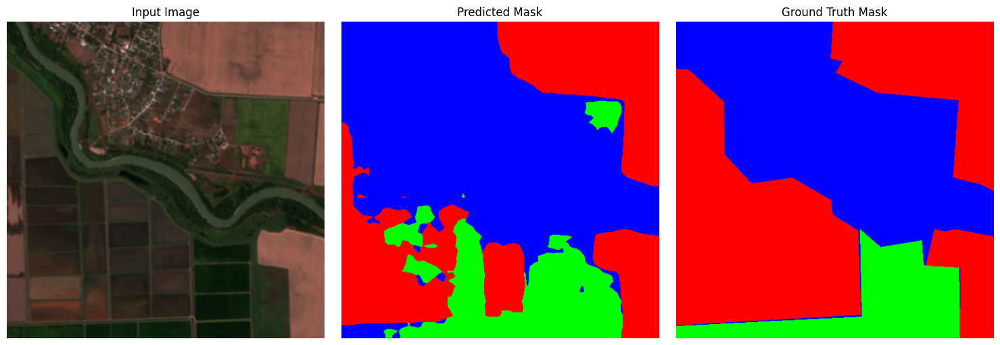

Train Loss = 0.42911045664832703. Test Loss = 0.3476754151639484


Epoch 20/25 [Test]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.67it/s, loss=0.28]


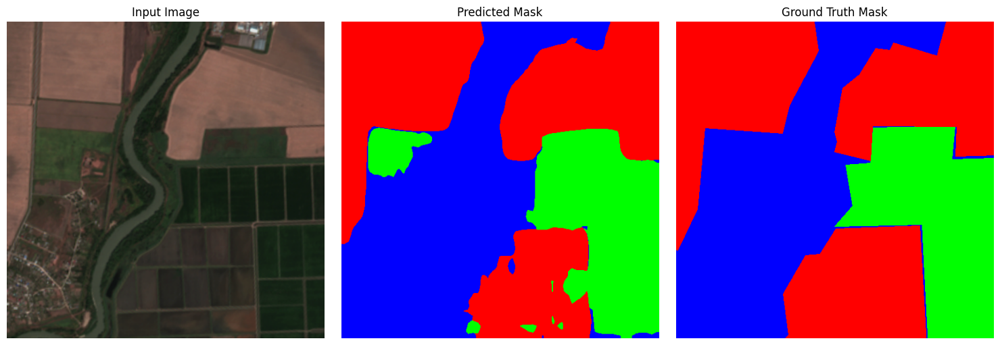

Train Loss = 0.45754958348614827. Test Loss = 0.38686166604359945


Epoch 21/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.61it/s, loss=0.252]


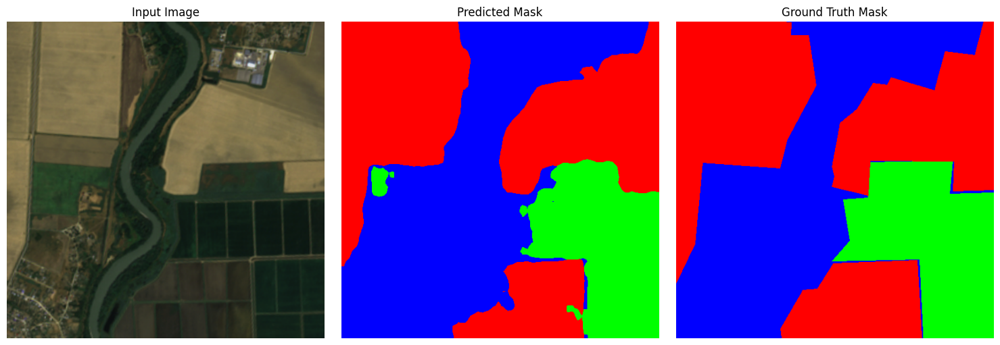

Train Loss = 0.4101674492870058. Test Loss = 0.32799756101199556


Epoch 22/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.62it/s, loss=0.177]


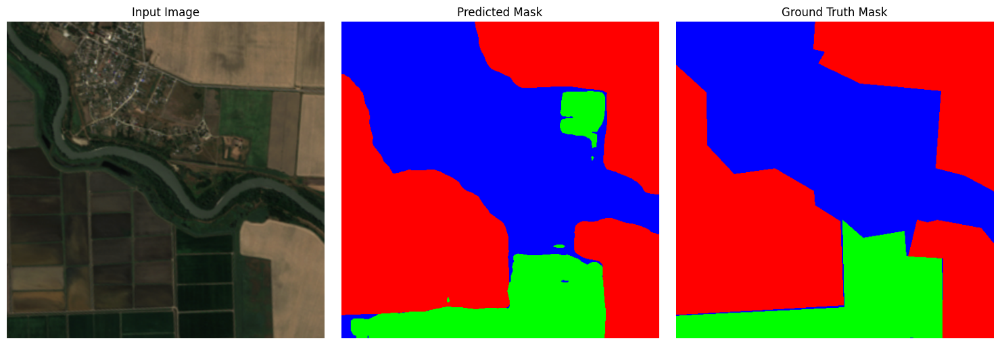

Train Loss = 0.3950168205159051. Test Loss = 0.3432157726514907


Epoch 23/25 [Test]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.67it/s, loss=0.0853]


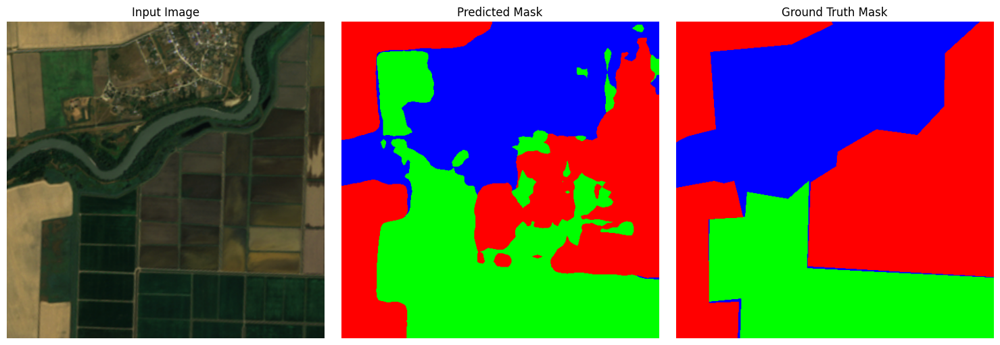

Train Loss = 0.4344415200608117. Test Loss = 0.3533230756719907


Epoch 24/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.66it/s, loss=0.177]


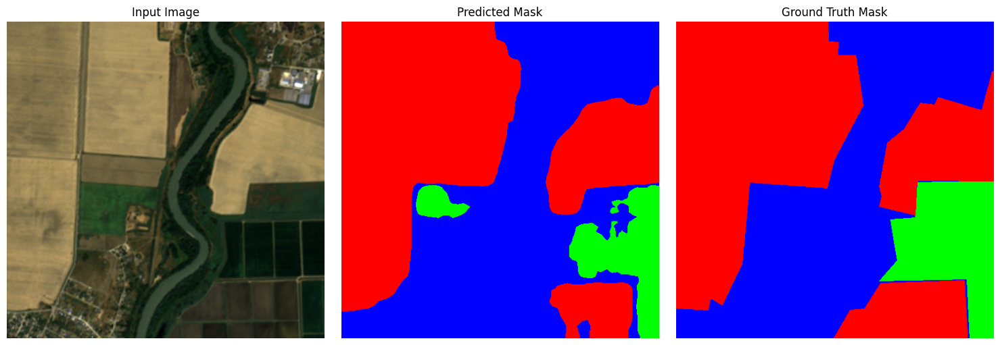

Train Loss = 0.38146491746107736. Test Loss = 0.30492296247255235


Epoch 25/25 [Test]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.58it/s, loss=0.185]


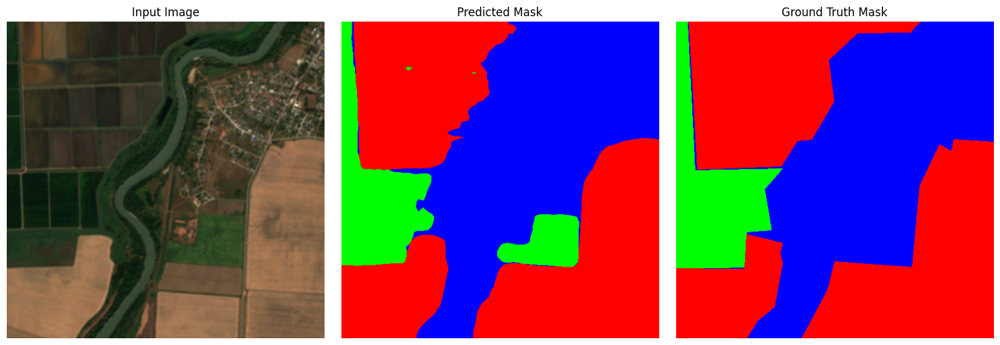

Train Loss = 0.39850038105533236. Test Loss = 0.30766765163058324


In [13]:
from src.train_loop import train
history = train(model, train_dataloader, test_dataloader, device, optimizer, 25, criterion, SAVE_DIR + "DeepLabv3")

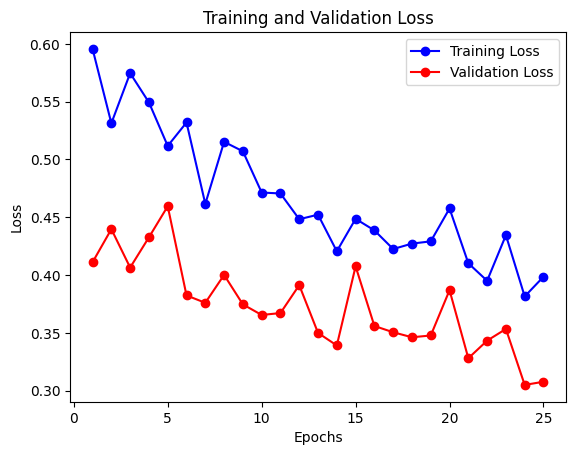

In [14]:
from src.data.utils import plot_history
plot_history(history)

Был достигнут отличный результат. Попробуем на немаркированном изображении

In [17]:
model.load_state_dict(torch.load(SAVE_DIR + 'DeepLabv3_epoch_24.pth'))

<All keys matched successfully>

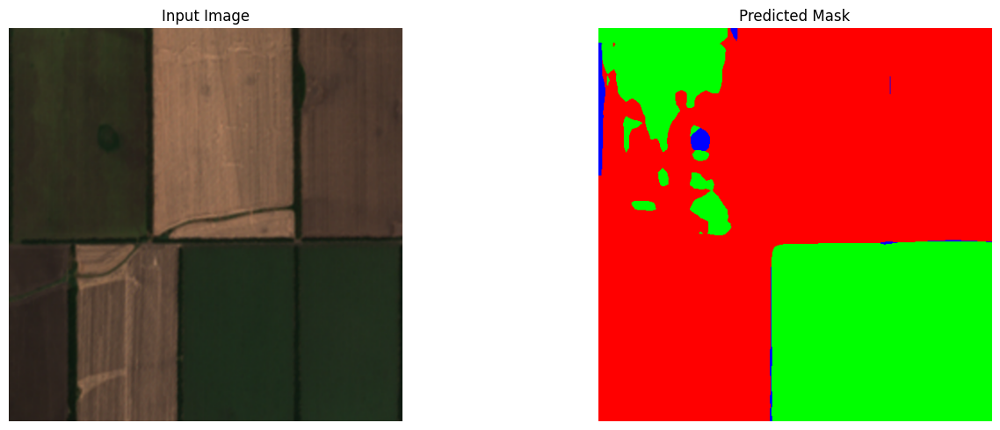

In [18]:
from src.data.utils import show_prediction_image
from PIL import Image
from torchvision.transforms import ToTensor

show_prediction_image(ToTensor()(Image.open(EXAMPLES_DIR + '512x512_fields.png')), model)

Картинка более гладкая, хоть тут тоже проблемы с определением очень тусклых полей

Перейдём к расчёту характеристик